In [4]:
import diffusers

In [14]:
from diffusers import AutoPipelineForImage2Image, StableDiffusionImg2ImgPipeline
from diffusers.utils import load_image, make_image_grid
import diffusers
import torch
from transformers import CLIPVisionModelWithProjection

image_encoder = CLIPVisionModelWithProjection.from_pretrained(
    "h94/IP-Adapter",
    subfolder="models/image_encoder",
    torch_dtype=torch.float16
)

# use from_pipe to avoid consuming additional memory when loading a checkpoint
pipeline = StableDiffusionImg2ImgPipeline.from_single_file(
    "disneyPixarCartoon_v10.safetensors", torch_dtype=torch.float16, variant="fp16", use_safetensors=True#, image_encoder=image_encoder,
).to("cuda")
pipeline.load_ip_adapter("h94/IP-Adapter", subfolder="models", weight_name="ip-adapter-plus-face_sd15.bin")

Fetching 11 files:   0%|          | 0/11 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Some weights of the model checkpoint were not used when initializing CLIPTextModel: 
 ['text_model.embeddings.position_ids']
You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion_img2img.StableDiffusionImg2ImgPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


ip-adapter-plus-face_sd15.bin:   0%|          | 0.00/98.2M [00:00<?, ?B/s]

In [15]:
pipeline.scheduler = diffusers.EulerDiscreteScheduler.from_config(
    pipeline.scheduler.config
)

In [9]:
# pipeline.load_lora_weights('./my_loras/', weight_name='PixarXL.safetensors', adapter_name="pixar-style")

In [10]:
from PIL import Image
import math

def create_collage(images, size=(1024, 1024)):
    num_images = len(images)
    cols = math.ceil(math.sqrt(num_images))
    rows = math.ceil(num_images / cols)

    img_width = size[0] // cols
    img_height = size[1] // rows

    collage = Image.new('RGB', size)

    x_offset = 0
    y_offset = 0
    for i, img in enumerate(images):
        # Resize and crop the image to fit
        img_aspect = img.width / img.height
        cell_aspect = img_width / img_height
        if img_aspect > cell_aspect:
            new_width = int(img_height * img_aspect)
            img = img.resize((new_width, img_height), Image.LANCZOS)
            left = (new_width - img_width) // 2
            img = img.crop((left, 0, left + img_width, img_height))
        else:
            new_height = int(img_width / img_aspect)
            img = img.resize((img_width, new_height), Image.LANCZOS)
            top = (new_height - img_height) // 2
            img = img.crop((0, top, img_width, top + img_height))

        collage.paste(img, (x_offset, y_offset))
        x_offset += img_width
        if (i + 1) % cols == 0:
            x_offset = 0
            y_offset += img_height

    return collage

Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /home/danielko/.insightface/models/buffalo_l/1k3d68.onnx landmark_3d_68 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /home/danielko/.insightface/models/buffalo_l/2d106det.onnx landmark_2d_106 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /home/danielko/.insightface/models/buffalo_l/det_10g.onnx detection [1, 3, '?', '?'] 127.5 128.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /home/danielko/.insightface/models/buffalo_l/genderage.onnx genderage ['None', 3, 96, 96] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /home/danielko/.insightface/models/buffalo_l/w600k_r50.onnx recognition ['None', 3, 112, 112] 127.

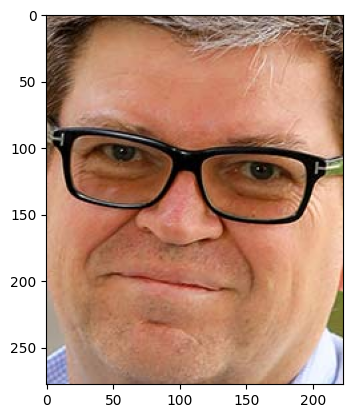

  0%|          | 0/30 [00:00<?, ?it/s]

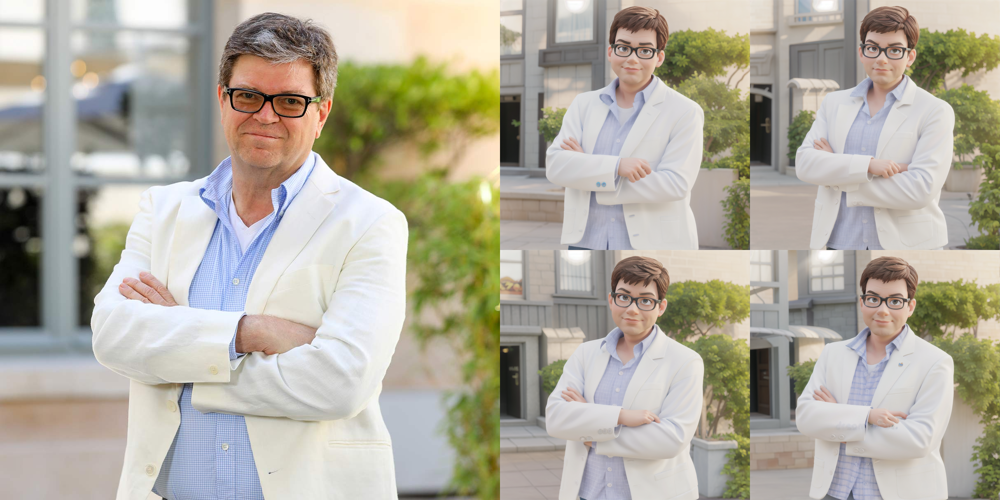

In [24]:
import cv2
from insightface.app import FaceAnalysis
import torch
import numpy as np
import matplotlib.pyplot as plt

app = FaceAnalysis(name="buffalo_l", providers=['CPUExecutionProvider'])
app.prepare(ctx_id=0, det_size=(640, 640))

path_or_url = "https://www.adagiapartners.com/wp-content/uploads/2022/09/yann-lecun-web.jpg"
init_image = load_image(path_or_url)

faces = app.get(np.array(init_image))

faceid_embeds = torch.from_numpy(faces[0].normed_embedding).unsqueeze(0)

bbox = faces[0]['bbox']
cropped_image = np.array(init_image)[int(bbox[1]):int(bbox[3]), int(bbox[0]):int(bbox[2])]
plt.imshow(cropped_image)
plt.show()

prompt = "breathtaking 3D image in the pixar styel, disney, cartoon, 4k,unreal engine, blender 8k,outdoor,natural lighting,adult,clear face,stock image"
negative_prompt = "noisy, sloppy, messy, grainy, highly detailed, ultra textured, photo, NSFW"
H, W = 1024, 1024
n_infer_steps = 32
guidance_scale = 10.5
prompt_strength = 0.6
high_noise_frac = 0.8
num_images_per_prompt = 4

ip_adapter_scale = 0.1

pipeline.set_ip_adapter_scale(ip_adapter_scale)

images = pipeline(prompt, 
                 negative_prompt=negative_prompt, 
                 image=init_image, 
                 strength=prompt_strength, 
                 guidance_scale=guidance_scale,
                 num_images_per_prompt=num_images_per_prompt,
                 target_size = (H, W),
                 ip_adapter_image=cropped_image,
                 clip_skip=2,
                 high_noise_frac=high_noise_frac)

image = create_collage(images.images, init_image.size)

make_image_grid([init_image, image], rows=1, cols=2)

In [11]:
# import cv2
# from insightface.app import FaceAnalysis
# import torch
# import numpy as np

# app = FaceAnalysis(name="buffalo_l", providers=['CUDAExecutionProvider', 'CPUExecutionProvider'])
# app.prepare(ctx_id=0, det_size=(640, 640))

# faces = app.get(np.array(init_image))

# faceid_embeds = torch.from_numpy(faces[0].normed_embedding).unsqueeze(0)

# import matplotlib.pyplot as plt
# bbox = faces[0]['bbox']
# cropped_image = np.array(init_image)[int(bbox[1]):int(bbox[3]), int(bbox[0]):int(bbox[2])]
# plt.imshow(cropped_image)
# plt.show()

  0%|          | 0/30 [00:00<?, ?it/s]

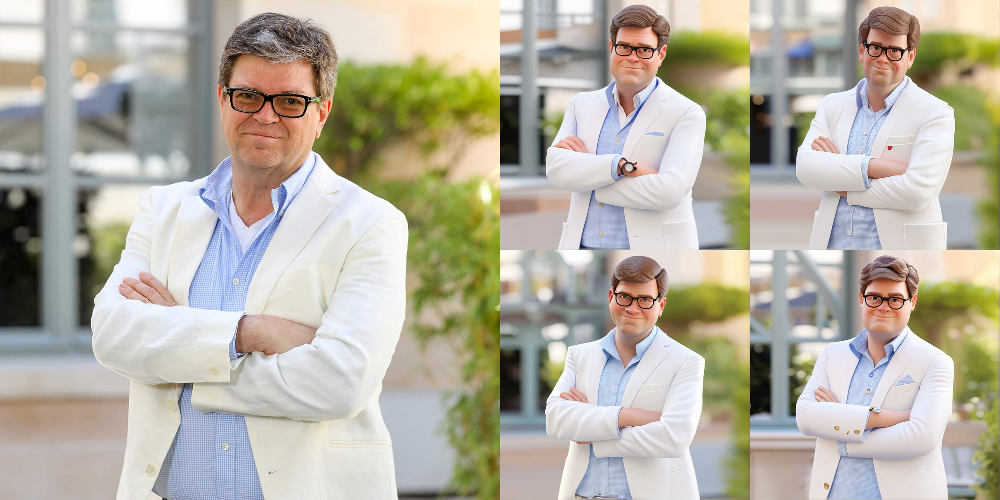

In [93]:
pipeline.enable_lora()

path_or_url = "https://www.adagiapartners.com/wp-content/uploads/2022/09/yann-lecun-web.jpg"
# path_or_url = './examples/musk_resize.jpeg'

init_image = load_image(path_or_url)
prompt = "breathtaking 3D image in the style of pixar-style"
negative_prompt = "noisy, sloppy, messy, grainy, highly detailed, ultra textured, photo, NSFW"
H, W = 1024, 1024
n_infer_steps = 50
guidance_scale = 15.5
prompt_strength = 0.6
high_noise_frac = 0.8
num_images_per_prompt = 4

lora_scale = 0.8
ip_adapter_scale = 0.1

pipeline.set_adapters(["pixar-style"], adapter_weights=[lora_scale])
pipeline.set_ip_adapter_scale(ip_adapter_scale)

images = pipeline(prompt, 
                 negative_prompt=negative_prompt, 
                 image=init_image, 
                 strength=prompt_strength, 
                 guidance_scale=guidance_scale,
                #  ip_adapter_image=cropped_image,
                 num_images_per_prompt=num_images_per_prompt,
                 target_size = (H, W),
                 clip_skip=2,
                 high_noise_frac=high_noise_frac)

image = create_collage(images.images, init_image.size)

make_image_grid([init_image, image], rows=1, cols=2)

Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /home/danielko/.insightface/models/buffalo_l/1k3d68.onnx landmark_3d_68 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /home/danielko/.insightface/models/buffalo_l/2d106det.onnx landmark_2d_106 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /home/danielko/.insightface/models/buffalo_l/det_10g.onnx detection [1, 3, '?', '?'] 127.5 128.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /home/danielko/.insightface/models/buffalo_l/genderage.onnx genderage ['None', 3, 96, 96] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: /home/danielko/.insightface/models/buffalo_l/w600k_r50.onnx recognition ['None', 3, 112, 112] 127.

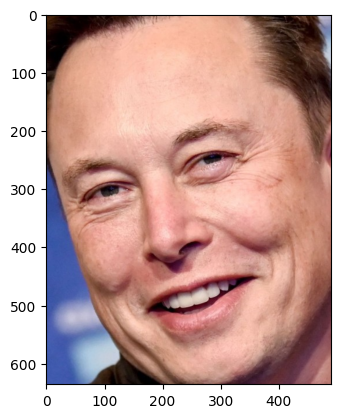

  0%|          | 0/45 [00:00<?, ?it/s]

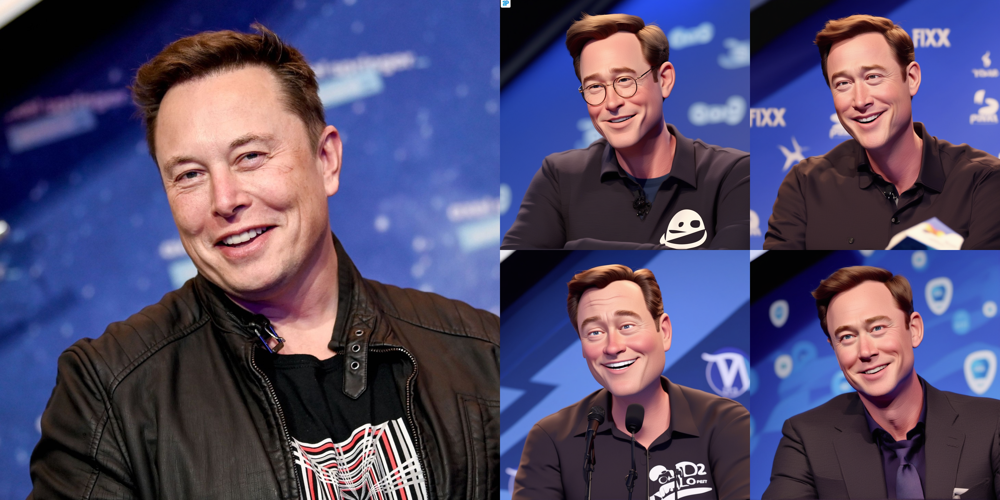

In [104]:
import cv2
from insightface.app import FaceAnalysis
import torch
import numpy as np

app = FaceAnalysis(name="buffalo_l", providers=['CPUExecutionProvider'])
app.prepare(ctx_id=0, det_size=(640, 640))

# path_or_url = "https://www.adagiapartners.com/wp-content/uploads/2022/09/yann-lecun-web.jpg"
path_or_url = './examples/musk_resize.jpeg'

init_image = load_image(path_or_url)

faces = app.get(np.array(init_image))

faceid_embeds = torch.from_numpy(faces[0].normed_embedding).unsqueeze(0)

import matplotlib.pyplot as plt
bbox = faces[0]['bbox']
cropped_image = np.array(init_image)[int(bbox[1]):int(bbox[3]), int(bbox[0]):int(bbox[2])]
plt.imshow(cropped_image)
plt.show()

pipeline.enable_lora()

prompt = "breathtaking 3D image in the pixar style, pixar-style, cartoon"
negative_prompt = "noisy, sloppy, messy, grainy, highly detailed, ultra textured, photo, NSFW"
H, W = 1024, 1024
n_infer_steps = 50
guidance_scale = 10.5
prompt_strength = 0.9
high_noise_frac = 0.8
num_images_per_prompt = 4

lora_scale = 1.0
ip_adapter_scale = 0.2

pipeline.set_adapters(["pixar-style"], adapter_weights=[lora_scale])
pipeline.set_ip_adapter_scale(ip_adapter_scale)

images = pipeline(prompt, 
                 negative_prompt=negative_prompt, 
                 image=init_image, 
                 strength=prompt_strength, 
                 guidance_scale=guidance_scale,
                 ip_adapter_image=cropped_image,
                 num_images_per_prompt=num_images_per_prompt,
                 target_size = (H, W),
                 clip_skip=1,
                 high_noise_frac=high_noise_frac)

image = create_collage(images.images, init_image.size)

make_image_grid([init_image, image], rows=1, cols=2)